<a href="https://colab.research.google.com/github/pren1/A_Pipeline_Of_Pretraining_Bert_On_Google_TPU/blob/master/VAST_data_preparation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data download

In [1]:
!mkdir audio
!cd audio/

mkdir: cannot create directory ‘audio’: File exists


In [2]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Select the Runtime → "Change runtime type" menu to enable a GPU accelerator, ')
  print('and then re-execute this cell.')
else:
  print(gpu_info)

Sun May  3 06:27:18 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.64.00    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   38C    P0    27W / 250W |      0MiB / 16280MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

In [3]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('To enable a high-RAM runtime, select the Runtime → "Change runtime type"')
  print('menu, and then select High-RAM in the Runtime shape dropdown. Then, ')
  print('re-execute this cell.')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 27.4 gigabytes of available RAM

You are using a high-RAM runtime!


In [4]:
!pip3 install --upgrade youtube-dl

Requirement already up-to-date: youtube-dl in /usr/local/lib/python3.6/dist-packages (2020.5.3)


In [5]:
!youtube-dl --extract-audio https://www.youtube.com/playlist?list=PL9jli3ZqRhJCNo1UKOFz9rPZ7A5M5MSml -o "/content/audio/%(title)s.%(ext)s"

[youtube:playlist] PL9jli3ZqRhJCNo1UKOFz9rPZ7A5M5MSml: Downloading webpage
[download] Downloading playlist: 兎田ぺこら ３D配信
[youtube:playlist] playlist 兎田ぺこら ３D配信: Downloading 3 videos
[download] Downloading video 1 of 3
[youtube] euPeRrN2Tco: Downloading webpage
[download] Destination: /content/audio/【#兎田ぺこら3D】兎田ぺこら3Dお披露目会ぺこ！【ホロライブ_兎田ぺこら】.webm
[download] 100% of 62.33MiB in 00:02
[ffmpeg] Destination: /content/audio/【#兎田ぺこら3D】兎田ぺこら3Dお披露目会ぺこ！【ホロライブ_兎田ぺこら】.opus
Deleting original file /content/audio/【#兎田ぺこら3D】兎田ぺこら3Dお披露目会ぺこ！【ホロライブ_兎田ぺこら】.webm (pass -k to keep)
[download] Downloading video 2 of 3
[youtube] 1vm6s_Joa5Y: Downloading webpage
[download] Destination: /content/audio/【#兎田ぺこら生誕祭】お誕生日だし3Dでいっぱい動いてみんなでお祝いぺこ！【ホロライブ_兎田ぺこら】.webm
[download] 100% of 64.25MiB in 00:02
[ffmpeg] Destination: /content/audio/【#兎田ぺこら生誕祭】お誕生日だし3Dでいっぱい動いてみんなでお祝いぺこ！【ホロライブ_兎田ぺこら】.opus
Deleting original file /content/audio/【#兎田ぺこら生誕祭】お誕生日だし3Dでいっぱい動いてみんなでお祝いぺこ！【ホロライブ_兎田ぺこら】.webm (pass -k to keep)
[download] Downloading v

In [0]:
import os
import pprint
def files_in_target_folder(path, extension=".opus"):
	# obtain all file paths in the target folder
	res_files=[]
	for file in os.listdir(path):
		if file.endswith(extension):
			res_files.append(file)
	return res_files

In [7]:
total_files = files_in_target_folder('/content/audio')
pprint.pprint(total_files)

['【#うさみやぺこた】罰ゲームあり！？３Dコラボでガチンコ勝負ぺこ！！！【ホロライブ_兎田ぺこら】.opus',
 '【#兎田ぺこら3D】兎田ぺこら3Dお披露目会ぺこ！【ホロライブ_兎田ぺこら】.opus',
 '【#兎田ぺこら生誕祭】お誕生日だし3Dでいっぱい動いてみんなでお祝いぺこ！【ホロライブ_兎田ぺこら】.opus']


# Spleeter

In [8]:
!pip install spleeter-gpu
!pip install pyvad

In [0]:
from spleeter.separator import Separator
from IPython.display import Audio
import IPython
import numpy as np
# Use audio loader explicitly for loading audio waveform :
from spleeter.audio.adapter import get_default_audio_adapter
import pdb
from tqdm import tqdm
import matplotlib.pyplot as plt
import numpy as np
from pyvad import vad, split

In [0]:
audio_path = f'audio/{total_files[2]}'
start_point = 48000*90
sample_rate = 48000
window_size = 48000 * 1
padding_length = 48000
building_length = start_point + window_size*60*5 # Process 10 seconds data in total

In [0]:
# Using embedded configuration.
separator = Separator('spleeter:2stems')
audio_loader = get_default_audio_adapter()

In [0]:
def stereoToMono(audiodata):
	'turn 2d array to 1d'
	return np.array(audiodata[:, 0] / 2 + audiodata[:, 1] / 2)
 
def visualize_results(accompaniment):
	plt.plot(accompaniment, color='c', label='data with padding')
	plt.show()

def getVocal(prediction, freq, beforeCnt=0, afterCnt=15):
    'use std to get the vocal interval'
    msList = []
    avgList = []
    varList = []
    voiceList = []
    for cnt, l in enumerate(prediction):  # 只提取人声键值
        for i in l:
            if i > - 0.05 and i < 0.05:
                msList.append(i)
        if not cnt % (freq / 50):  # 每20ms取一次方差
            varList.append(np.var(msList))  # 每20ms内的方差值
            avgList.append(np.mean(msList))  # 每20ms内的平均值
            msList = []
    med = np.median(varList)  # 1分钟内所有方差中位数
    cnt = beforeCnt  # 用户设置打轴前侧预留时间 / 20ms的次数 默认1次
    start = 0  # 人声开始时间
    end = 0  # 人声结束时间
    avgVarList = []  # 平滑方差值
    for varCnt in range(len(varList) - 5):
        avgVarList.append(np.mean(varList[varCnt:varCnt + 5]))  # 方差值+后四位一起取平均
    avgVarList += varList[-4:]  # 补上最后四个没计算的方差值
    while cnt < len(avgVarList) - afterCnt:  # 开始判断人声区域
        if avgVarList[cnt] >= med and avgVarList[cnt] >= 0.0001:  # 平均方差值同时超过1分钟内方差中位数和0.0001
            start = (cnt - beforeCnt) * 20  # 开始时间为当前时间-用户前侧留白时间
            cnt += afterCnt  # 向后延伸用户后侧留白时间 / 20ms的次数 默认10次
            if cnt < len(avgVarList):  # 没超出一分钟则开始往后查询
                finishToken = False
                while not finishToken:
                    try:  # 查询超出长度一律跳出循环
                        while avgVarList[cnt] >= med:  # 向后查询至平均方差值<中位数
                            cnt += 1
                        cnt += afterCnt  # 补一次用户留白时间后再次判断平均方差值<中位数 是则通过
                        if avgVarList[cnt] < med:
                            finishToken = True
                    except:
                        break
            end = cnt * 20  # 结束时间即结束向后查询的时间
            voiceList.append([start, end])  # 添加起止时间给信号槽发送
        else:
            cnt += 1  # 没检测到人声则+1
    return avgList, varList, voiceList

def sep(prediction, freq = 48000):
    'visualize vocal results'
    avgList, varList, voiceList = getVocal(prediction, freq)

    result_interval = np.zeros((1000 * int(len(prediction) / freq)))
    for result in voiceList:
        result_interval[result[0]: result[1]] = 1

    fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(14, 6))
    x_range = np.arange(len(result_interval)) / (len(result_interval)/len(avgList))

    ax[0].plot(avgList, color='red', label='avgList')
    twin_axis = ax[0].twinx()
    twin_axis.plot(x_range, result_interval, c='cyan')
    ax[0].legend()

    ax[1].plot(varList, color='red', label='varList')
    twin_axis = ax[1].twinx()
    twin_axis.plot(x_range, result_interval, c='cyan')
    ax[1].legend()

    plt.show()
    return voiceList

In [0]:
'load file'
waveform, _ = audio_loader.load(audio_path, sample_rate=sample_rate)

In [14]:
vocal_res = []
accompan_res = []

for split_waveform_index in tqdm(range(start_point, building_length, window_size)):
	# Perform the separation :
	clipped_waveform = waveform[split_waveform_index:min(split_waveform_index + window_size, len(waveform))]
	'add padding zeros to each waveform'
	zero_padded_waveform = np.zeros((clipped_waveform.shape[0] + padding_length*2, clipped_waveform.shape[1]))
	zero_padded_waveform[padding_length:-padding_length] = clipped_waveform
	'we may also use the extra data'
	if split_waveform_index-padding_length >= 0 and split_waveform_index + window_size + padding_length < len(waveform):
		zero_padded_waveform[:padding_length] = waveform[split_waveform_index-padding_length:split_waveform_index]
		zero_padded_waveform[-padding_length:] = waveform[split_waveform_index + window_size: split_waveform_index + window_size + padding_length]

	'sperate using spleeter'
	prediction = separator.separate(zero_padded_waveform)
	'clip padded part, throw them away'
	prediction['vocals'] = prediction['vocals'][padding_length: -padding_length]
	prediction['accompaniment'] = prediction['accompaniment'][padding_length: -padding_length]
	'merge results together'
	vocal_res.extend(prediction['vocals'])
	accompan_res.extend(prediction['accompaniment'])

  0%|          | 0/300 [00:00<?, ?it/s]

INFO:tensorflow:Using config: {'_model_dir': 'pretrained_models/2stems', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': gpu_options {
  per_process_gpu_memory_fraction: 0.7
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_session_creation_timeout_secs': 7200, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x7fdd54a4f898>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Apply unet for vocals_spectrogram
Instructions for updating:
If using Keras pass *_co

100%|██████████| 300/300 [00:15<00:00, 19.13it/s]


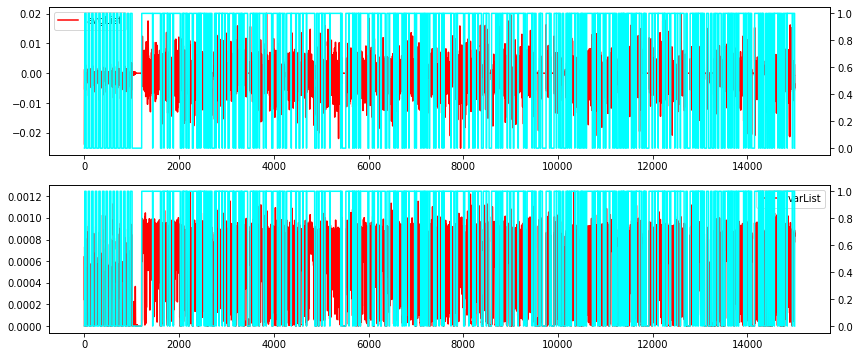

In [15]:
dur_info = sep(np.asarray(vocal_res))
scale_rate = int(sample_rate/1000)
dur_info = [[x[0] * scale_rate, x[1] * scale_rate] for x in dur_info]

In [0]:
'Turn to Mono'
vocal_res = stereoToMono(np.asarray(vocal_res))
result_interval = np.zeros((int(len(vocal_res))))
for result in dur_info:
	result_interval[int(result[0]): int(result[1])] = 1

BGM

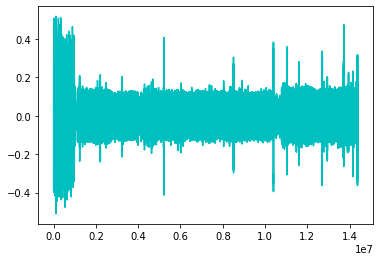

In [17]:
visualize_results(accompan_res)

In [0]:
# Audio(np.asarray(accompan_res).T, rate=48000)

Original audio

In [0]:
# Audio(waveform[start_point:building_length].T, rate=48000)

In [0]:
# def rolling_window(a, window):
#     shape = a.shape[:-1] + (a.shape[-1] - window + 1, window)
#     strides = a.strides + (a.strides[-1],)
#     return np.lib.stride_tricks.as_strided(a, shape=shape, strides=strides)

def rolling_window(array, window):
    half_window_size = window//2
    res = []
    for index in range(len(array)):
      current_slice = array[max(index - half_window_size, 0):min(index + half_window_size, len(array))]
      res.append(np.std(current_slice))
    return np.asarray(res)

def end_clip(array, threshold):
  end_part = 0
  for i in range(len(array)):
    if array[~i] < threshold:
      pass
    else:
      return array[:~i], i
  assert (1 == 0), "array totally below threshold"

Splitted vocals

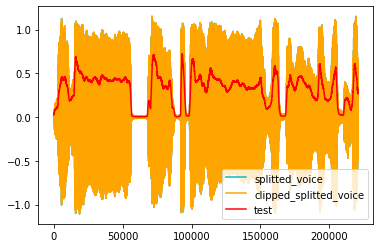

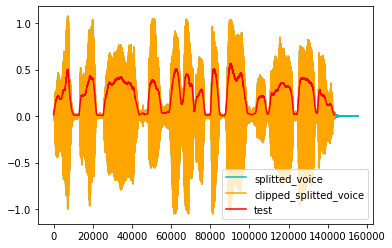

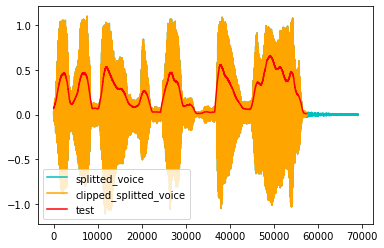

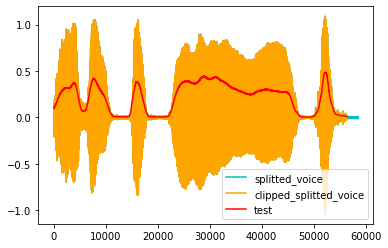

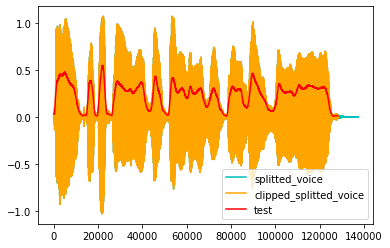

...

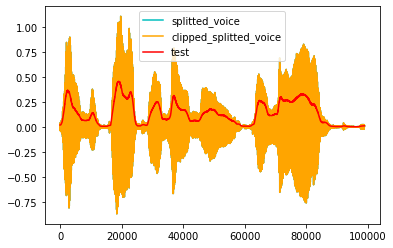

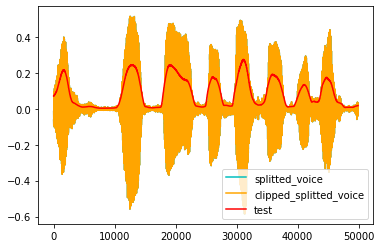

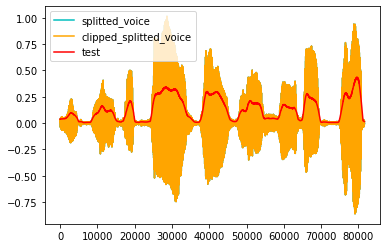

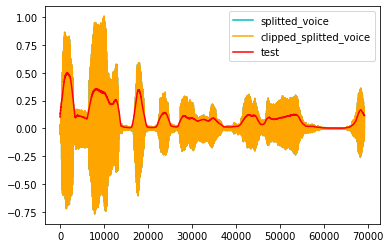

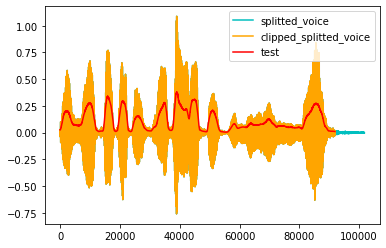

In [22]:
for single_info in dur_info:
    if single_info[1] - single_info[0] > sample_rate:
      splitted_voice = vocal_res[single_info[0]:single_info[1]]
      std_info, clip_index = end_clip(rolling_window(splitted_voice, 960), threshold = 0.01)
      clipped_splitted_voice = splitted_voice[:~clip_index]
      plt.plot(splitted_voice, color = 'c', label='splitted_voice')
      plt.plot(clipped_splitted_voice, color = 'orange', label='clipped_splitted_voice')
      plt.plot(std_info, color = 'r', label='test')
      plt.legend()
      plt.show()
      IPython.display.display(IPython.display.Audio(np.asarray(clipped_splitted_voice).T, rate=48000))
      # pdb.set_trace()